# Import what we need

In [1]:
import sys
import numpy as np
import pandas as pd
import scanpy.api as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import gc
import random
from sklearn.utils import shuffle


The current input file is /ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/CLUESImmVar_processed.h5ad with a time stamp of 01/03/2019

In [2]:
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False

##logging.basicConfig(filename="CLUESImmVar_processed.V4.1.log", level=logging.ERROR)
sc.settings.set_figure_params(dpi=100, dpi_save=600, format='png')

plt.rcParams["image.aspect"] = "equal"
##%matplotlib inline

# Read in the data, this could take a while

In [5]:
version = "V6"

dirpath = os.getcwd()
name = "/Users/yimmieg/Downloads/CLUESImmVar_processed."+version
##processed_path = "/Users/yechun/Downloads/"+name+".h5ad"
processed_path = name+'.h5ad';
# processed_path = os.path.normpath(processed_path)
print(processed_path)
adata = sc.read(processed_path, cache=True)
##adata = sc.read(processed_path)
adata.shape

figdir = "./figures."+version+"/"
sc.settings.figdir = "./figures."+version+"/"

## order the cell types for plotting purposes
##adata.obs.ct_cov = adata.obs.ct_cov.cat.reorder_categories(['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B', 'MK', 'Progen'])

/Users/yimmieg/Downloads/CLUESImmVar_processed.V6.h5ad


In [6]:
## since we have replicates, let's sort adata in a consistent way
adata_obs_sorted = adata.obs.sort_values(by=['disease_cov','ind_cov','batch_cov'], ascending=False);
adata = adata[adata_obs_sorted.index]

In [7]:
adata.obs['site'] = pd.Categorical(adata.obs.disease_cov, categories=['Broad','UCSF'])
adata.obs.site[adata.obs.batch_cov.str.contains("immvar")] = "Broad"
adata.obs.site[~adata.obs.batch_cov.str.contains("immvar")] = "UCSF"

adata.obs['disease_pop_site_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)

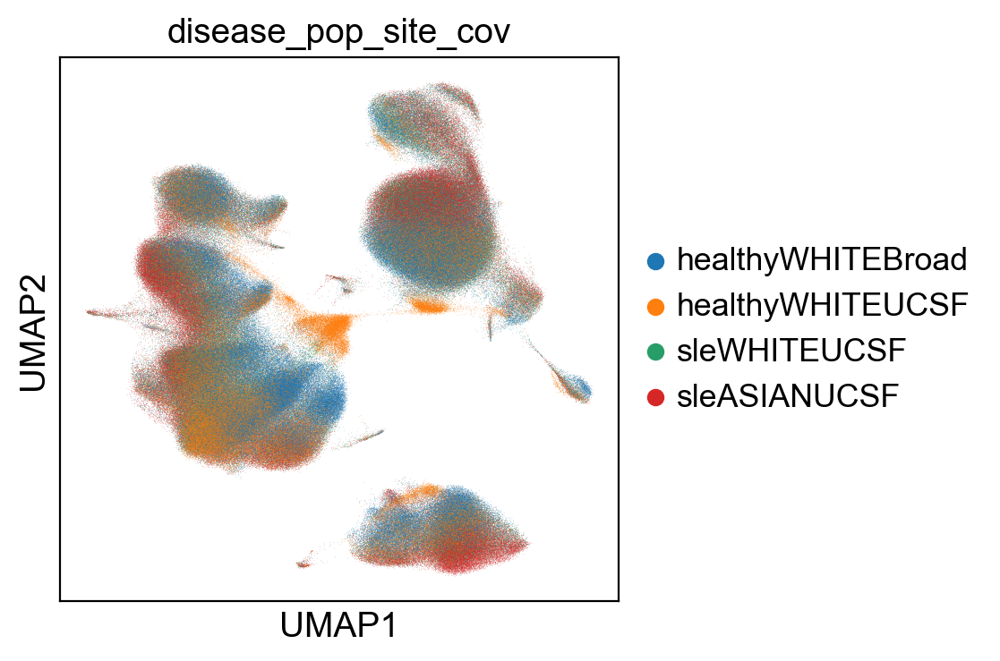

In [8]:
sc.pl.umap(adata, color="disease_pop_site_cov")

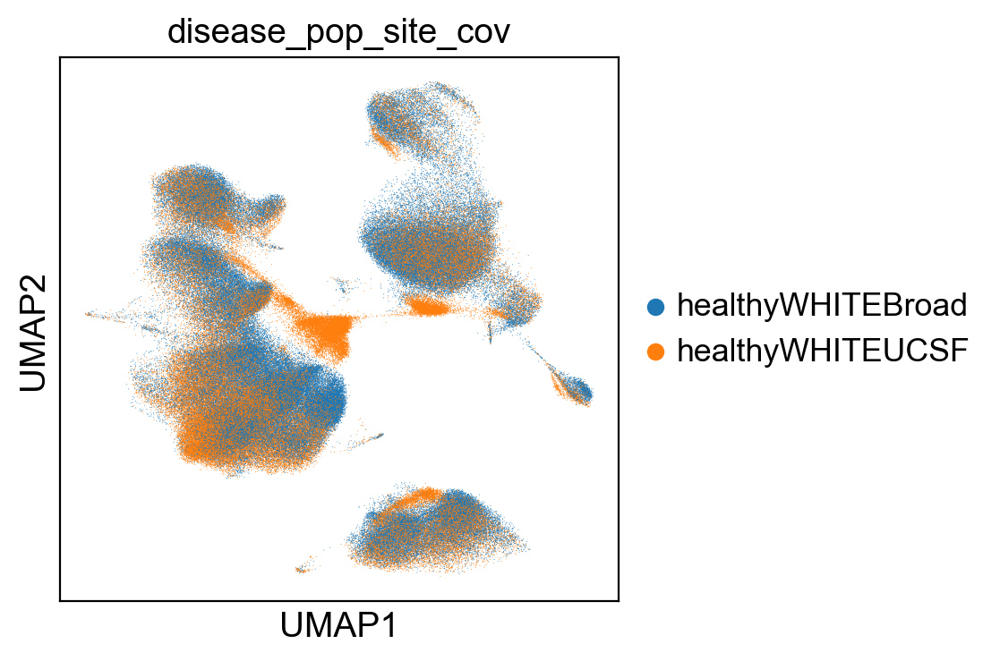

In [9]:
sc.pl.umap(adata[(adata.obs.disease_cov == "healthy")],color="disease_pop_site_cov")

In [10]:
adata.obs.to_csv('adata.obs.txt')

# Figure 1B: Projection and dropprint

## Next, make the disease plot

saving figure to file ./figures.V6/umap.disease.png


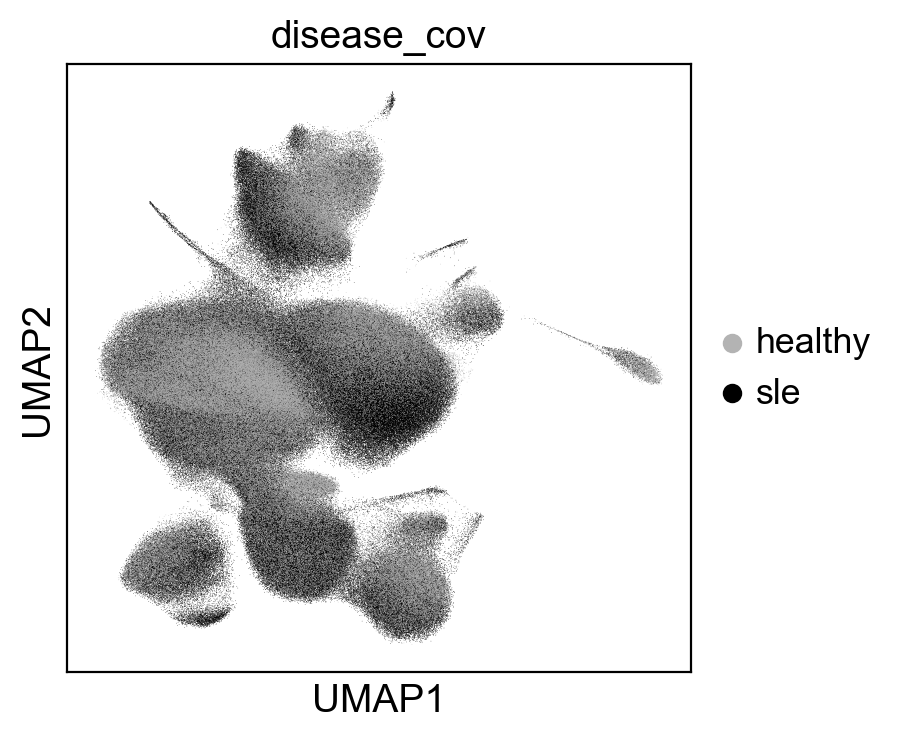

In [4]:
disease_umap = sc.pl.umap(adata, color='disease_cov', size=0.2, edgecolor="none", palette=['#B3B3B3','#000000'])
disease_umap = sc.pl.umap(adata, color='disease_cov', size=0.2, edgecolor="none", palette=['#B3B3B3','#000000'], save='.disease.png')

In [181]:
# ## Make disease plot (Fig. 1B)
# ## flipping the disease labels so that the healthy plots on top of the sle
# adata.obs['disease_cov'] = pd.Categorical(adata.obs['disease_cov'],categories=['sle','healthy'], ordered=True)
# ##adata.uns['disease_cov_colors'] = ['#3A87BC','#ED8A2F'];

# ##disease_tsne = sc.pl.tsne(adata, color='disease_cov', size=0.5)
# ##celltype_umap = sc.pl.umap(adata, color='ct_cov', size=1, edgecolor="none", save='.png')
# disease_umap = sc.pl.umap(adata, color='disease_cov', size=1, edgecolor="none", save='.disease.png')
# disease_umap = sc.pl.umap(adata, color='disease_cov', size=1, edgecolor="none")

# ## testing returning an axes object which should allow for more customization
# ## disease_tsne2 = sc.pl.tsne(adata, color='disease_cov', size=0.5, show=False)

# ## flipping the disease/healthy labels back for all of the downstream analysis
# adata.obs['disease_cov'] = pd.Categorical(adata.obs['disease_cov'],categories=['healthy','sle'], ordered=True)

## Now, let's make a plot for each of the 16 people in batch 1 as a demo of variability

### make all batches

In [182]:
# ## let's plot 16 plots for the individuals in the first batch (Fig. 1B)
# colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F"];
# ##batch_07_19_inds = adata.obs.ind_cov[adata.obs.batch_cov=='lupus7.19'].unique()
# ##batch_07_19_inds = np.sort(batch_07_19_inds.categories.values);

# for batch_i in range(len(adata.obs.batch_cov.unique())) :
#     fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7),sharex=True, sharey=True)
#     fig.tight_layout()
#     ##plt.subplots_adjust(left=0, right=0.1, top=0.1, bottom=0, wspace=0.1, hspace=0.1)
#     plt.subplots_adjust(wspace=-0.1, hspace=0)

#     batch_name = adata.obs.batch_cov.unique()[batch_i]
#     batch = adata.obs.ind_cov[adata.obs.batch_cov==batch_name].unique();
#     batch = np.sort(batch.categories.values)

#     for ind_i in list(range(batch.shape[0])) :
#         ind = batch[ind_i]
#         col = colors[ind_i]
#         sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ind_cov", title=None, palette=[col,col], ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=20, edgecolor="none")
#         ##ax[(ind_i-1)%4,math.floor(ind_i/4)].label_outer()
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")
    
#     fig.savefig(figdir+'/'+batch_name+'.ind.png')

### make only the first batch

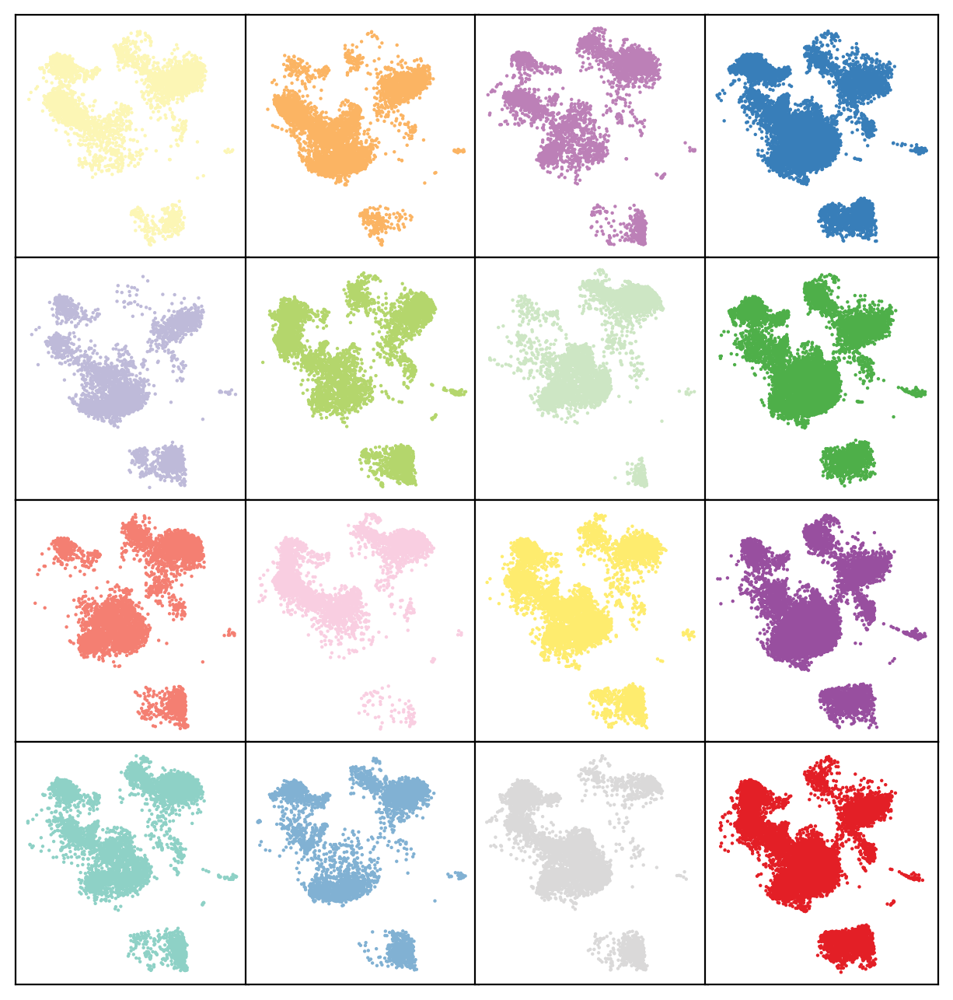

In [201]:
##sc.pl.umap(adata, color=['batch_cov'])
colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F"];

batch_07_19_inds = adata.obs.ind_cov[adata.obs.batch_cov=='lupus7.19'].unique()
batch_07_19_inds = np.sort(batch_07_19_inds.categories.values);

fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7), sharex=True, sharey=True)
fig.tight_layout()
##plt.subplots_adjust(left=0, right=0.1, top=0.1, bottom=0, wspace=0.1, hspace=0.1)
plt.subplots_adjust(wspace=-0.1, hspace=0)

for ind_i in list(range(batch_07_19_inds.shape[0])) :
    ind = batch_07_19_inds[ind_i]
    col = colors[ind_i]
    sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ind_cov", title=None, palette=[col,col], ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=10, edgecolor="none")
    ##ax[(ind_i-1)%4,math.floor(ind_i/4)].label_outer()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")

fig.savefig(figdir+'/umap.ind.png')

# Figure 1C: Cell type annotation of projection

## First, let's make the louvain plot

In [184]:
# ##sc.pl.umap(adata, color=['batch_cov'])
# ##colors = ["#8ED1C6","#FCF6B5", "#BEBAD9", "#F47F72", "#81B1D3", "#FBB463", "#B4D66C", "#F9CEE1", "#DAD9D9", "#BC80B7", "#CDE6C4", "#FEEC6E", "#E31F26", "#387EB9", "#4EAF49", "#984F9F"];

# fig,ax = plt.subplots(nrows=5,ncols=6, figsize=(7,7), sharex=True, sharey=True)
# fig.tight_layout()
# ##plt.subplots_adjust(left=0, right=0.1, top=0.1, bottom=0, wspace=0.1, hspace=0.1)
# ##plt.subplots_adjust(wspace=0.1, hspace=0.1)

# for cluster_i in range(len(adata.obs.louvain.unique())) :
#     cluster = adata.obs.louvain.unique()[cluster_i]
#     if len(adata[adata.obs.louvain==cluster,]) > 0 :
#         col = sc.pl.palettes.default_26[cluster_i]
#         sc.pl.umap(adata[adata.obs.louvain==cluster,], color = "louvain", title=None, palette=[col,col], ax=ax[(cluster_i-1)%5,math.floor(cluster_i/5)], size=2, edgecolor="none")
#         ##ax[(ind_i-1)%4,math.floor(ind_i/4)].label_outer()
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].get_xaxis().set_visible(False)
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].get_yaxis().set_visible(False)
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].get_legend().remove()
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].set_title(cluster)
#         ax[(cluster_i-1)%5,math.floor(cluster_i/5)].set_aspect("equal")
    
# fig.savefig('figures/umap.cluster.louvain.png')

In [11]:
sc.tl.leiden(adata, random_state=30, resolution=3)

running Leiden clustering
    finished (13:03:36.24)


ranking genes
    finished (0:18:54.66)


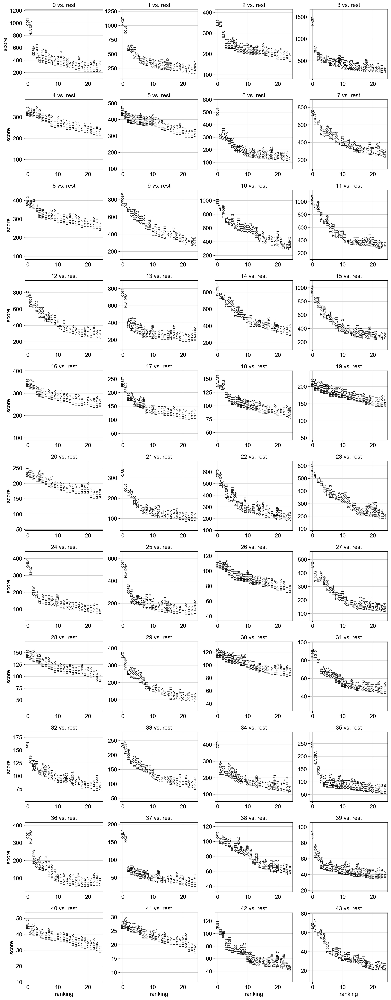

In [12]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [ ]:
# sc.tl.louvain(adata, random_state=30, resolution=1.5)
sc.pl.umap(adata, color='louvain',size=1, edgecolor="none")
sc.pl.umap(adata, color='louvain', size=1, edgecolor="none", save='.louvain.png')

saving figure to file ./figures.V6/umap.leiden.png


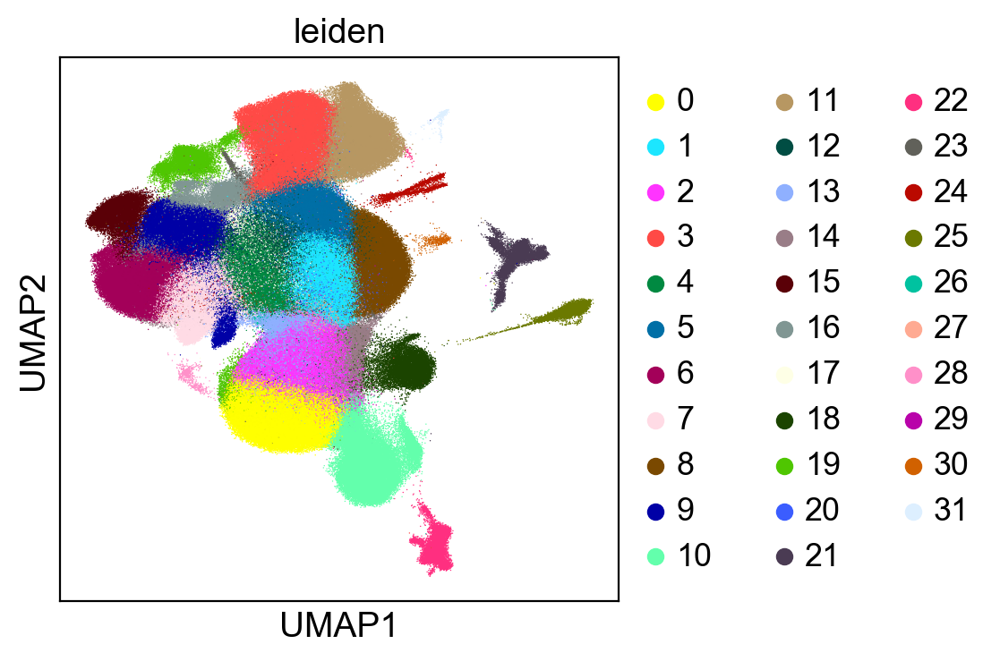

In [6]:
# sc.tl.louvain(adata, random_state=30, resolution=1.5)
sc.pl.umap(adata, color='leiden',size=1, edgecolor="none")
sc.pl.umap(adata, color='leiden', size=1, edgecolor="none", save='.leiden.png')

In [ ]:
# adata.obs.ct_cov = adata.obs.ct_cov.astype("str")
# # ## do some manual cell type assignment
# adata.obs.ct_cov.loc[adata.obs.leiden == "0"] = "cM" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "1"] = "cM" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "2"] = "Th" ## good                                                                                     
# adata.obs.ct_cov.loc[adata.obs.leiden == "3"] = "B" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "4"] = "Tc" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "5"] = "Tc" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "6"] = "Tc" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "7"] = "Th" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "8"] = "Th" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "9"] = "NK" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "10"] = "ncM" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.leiden == "11"] = "B" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "12"] = "Th" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.leiden == "13"] = "cDC" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.leiden == "14"] = "NK" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.leiden == "15"] = "MK" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.leiden == "16"] = "Th" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.leiden == "17"] = "pDC" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.leiden == "18"] = "ncM" ## good                                                                              
# adata.obs.ct_cov.loc[adata.obs.leiden == "19"] = "Th" ## good                                                                               
# adata.obs.ct_cov.loc[adata.obs.leiden == "20"] = "Th" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.leiden == "21"] = "cM" ## doublets or IFN activated T?                                                            
# adata.obs.ct_cov.loc[adata.obs.leiden == "22"] = "ProlifT" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.leiden == "23"] = "NK" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "24"] = "Th" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.leiden == "25"] = "Progen" ## good
# adata.obs.ct_cov.loc[adata.obs.leiden == "26"] = "B" ## good
# adata.obs.ct_cov = adata.obs.ct_cov.astype('category')

saving figure to file ./figures.V5.1/umap.celltype.png


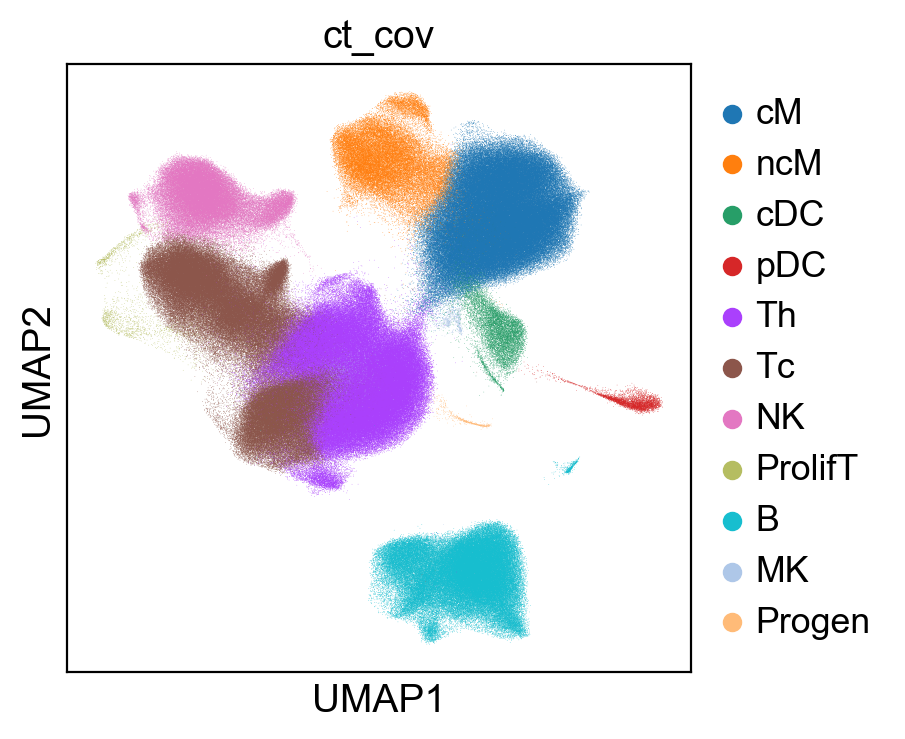

In [194]:
## Make cell type plot (Fig. 1C)
adata.uns['ct_cov_colors'] = sc.pl.palettes.vega_20_scanpy;
celltype_umap = sc.pl.umap(adata, color='ct_cov', size=0.2, edgecolor="none", save='.celltype.png')
celltype_umap = sc.pl.umap(adata, color='ct_cov',size=0.2, edgecolor="none")

In [ ]:
celltype_umap = sc.pl.umap(adata[(adata.obs.disease_cov=="sle") & (adata.obs.pop_cov=="WHITE")], color='ct_cov',size=1, edgecolor="none")
celltype_umap = sc.pl.umap(adata[(adata.obs.disease_cov=="sle") & (adata.obs.pop_cov=="ASIAN")], color='ct_cov',size=1, edgecolor="none")

In [ ]:
## platelet effect
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3)
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='.platelet.png')

In [ ]:
## cycling
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3)
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3, save='.cycling.png')

In [ ]:
## CD4, CD8 and NK axis
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1"],size=3)
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1"],size=3, save=".TNK.png")

In [ ]:
## treg
sc.pl.umap(adata, color=["FOXP3","TNFRSF4","ENTPD1","CCR10"],size=3)

In [ ]:
## y chromosome gender effect
sc.pl.umap(adata, color=["DDX3Y", "RPS4Y1", "FHIT","TRAT1"], size =3)

In [ ]:
## b cells, plasmablasts and pdcs
sc.pl.umap(adata, color=["MZB1", "IGJ", "CD79A"],size=3)

# Figure 1D: Cell type proportion differences between case/control

## Cell proportion analysis using Broad ImmVar

In [ ]:
## Make proportion plots (Fig. 1D)

##adata_obs_small = adata.obs[(adata.obs.study_cov=="ImmVar") & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & (adata.obs.study_cov=="CLUES"))]
adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
##adata_obs_small = adata.obs[(adata.obs.batch_cov.str.contains("lupus"))]

##ind_count = adata_obs_small.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov',"batch_cov"])['ct_cov'].count()

##ind_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##ind_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")

ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.counts > 100])]


In [ ]:
##ct_group = pd.DataFrame( {'ct_cov':['B','CD14 Monoc','CD16 Monoc', 'CD4+ T', 'CD8+ T', 'MK', 'NK', 'cDC', 'pDC','Progenitor','Proliferat'], 'ct_group':['lymph', 'mono', 'mono', 'lymph','lymph', 'mkc','lymph','dc','pdc','progen','lymph']})
ct_group = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'Prolif T', 'cDC', 'pDC', 'MK', 'Progen'], 'ct_group':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})
ind_perc.ind_cov = ind_perc.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov = ind_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(ct_group.set_index('ct_cov'))
ind_perc.ind_cov = ind_perc.ind_cov.astype("str")
##ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

print('as a proportion of total PBMC ')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
    
print('\nwhite sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.pop_cov=="WHITE"].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[ind_perc.pop_cov=="WHITE"].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
print('\nwhite sle vs asian sle')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.disease_cov=="sle"].ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc[ind_perc.disease_cov=="sle"].pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), pop.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))

In [ ]:
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])

perc_plot.savefig(figdir+"/violin.ct_cov.png")
#fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
#fig.tight_layout()

##for ct_i in list(range(10)) :
##    ct = ind_perc.ct_cov.cat.categories[ct_i]
##    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
##    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

In [ ]:
ind_perc['disease_pop_cov'] = pd.Categorical(ind_perc.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)
perc_plot = sns.catplot(x='disease_pop_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', aspect=0.5, height=4, 
                        dodge=False, sharex=False, sharey=False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_pop_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])
    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)


perc_plot.savefig(figdir+"/violin.ct_cov_pop.png")

In [ ]:
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])

perc_plot.savefig(figdir+"/violin.ct_cov.png")
#fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
#fig.tight_layout()

##for ct_i in list(range(10)) :
##    ct = ind_perc.ct_cov.cat.categories[ct_i]
##    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
##    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

In [ ]:
ind_perc['disease_pop_cov'] = pd.Categorical(ind_perc.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)
perc_plot = sns.catplot(x='disease_pop_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', aspect=0.5, height=4, 
                        dodge=False, sharex=False, sharey=False)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_pop_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])
    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)


perc_plot.savefig(figdir+"/violin.ct_cov_pop.png")

In [ ]:
# fig,ax = plt.subplots(nrows=1,ncols=11, figsize=(20,5))
# fig.tight_layout()


# for ct_i in list(range(11)) :
#     ct = ind_perc.ct_cov.cat.categories[ct_i]
#     ax[ct_i].set_yscale('log')
#     ax[ct_i].set_ylim(0.1,100)
#     sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#     sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

## Cell proportion analysis of replicated healthy individuals UCSF and Broad

In [ ]:
## we should be able to combine the cell type proportion estimates for the samples processed in Boston vs those processed in SF

In [ ]:
## let's check the healthy reproducibility at UCSF

In [ ]:
adata_obs_small = adata.obs[(adata.obs.batch_cov.str.contains("lupus"))& (adata.obs.ind_cov.str.contains("IGTB"))]

ind_count2 = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov',"batch_cov"])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count2_sums = ind_count2.groupby(["ind_cov","batch_cov"]).sum()
ind_count2_sums = ind_count2_sums.reset_index(name="counts")

##ind_count2_sums = ind_count2.groupby(level=[0]).sum()
##ind_count2_sums = ind_count2_sums.reset_index(name="counts")

ind_perc2 = ind_count2/ind_count2.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ind_perc2 = ind_perc2.reset_index(name="ct_perc")
ind_perc2['disease_pop_cov'] = pd.Categorical(ind_perc2.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)

ct_group = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'Prolif T', 'cDC', 'pDC', 'MK', 'Progen'], 'ct_group':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})
ind_perc2.ind_cov = ind_perc2.ind_cov.apply(lambda x: x.split('_')[0])
ind_count2_sums.ind_cov = ind_count2_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc2 = ind_perc2.set_index('ct_cov').join(ct_group.set_index('ct_cov'))
ind_perc2.ind_cov = ind_perc2.ind_cov.astype("str")
##ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc2.reset_index(inplace=True)
ind_perc2.ct_cov = ind_perc2.ct_cov.astype('category')
ind_perc2.ct_cov = ind_perc2.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

## filter samples that have < 100 cells
##ind_perc2 = ind_perc2[ind_perc2.ind_cov.isin(ind_count2_sums.ind_cov[ind_count2_sums.counts > 100])]

# g = sns.FacetGrid(ind_perc2, col="ct_cov",  hue="ct_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
# g = g.map(plt.scatter, "", "ct_percs", edgecolor="w")
# g.fig.subplots_adjust(wspace=0.2)
# g.savefig(figdir+"/ifn.ct_cov.png")

In [ ]:
ind_perc_all_healthy = ind_perc[ind_perc.disease_cov=="healthy"].append(ind_perc2)

In [ ]:
ind_perc_all_healthy_pivot = ind_perc_all_healthy.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")

In [ ]:
ind_perc2_pivot = ind_perc2.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")

In [ ]:
ind_perc2_pivot_ct_group = ind_perc2.pivot_table(index=["ct_group"], columns=["ind_cov","batch_cov"], values="ct_perc")

In [ ]:
ind_perc2_pivot_cor = ind_perc2_pivot.corr()
##np.fill_diagonal(ind_perc2_pivot_cor.values,np.nan)
ind_perc2_pivot_cor_norm=(ind_perc2_pivot_cor-ind_perc2_pivot_cor.mean())/ind_perc2_pivot_cor.std()

fig, ax = plt.subplots(figsize=(15,15))
ax = sns.heatmap(ind_perc2_pivot_cor_norm)

In [ ]:
rep1 = np.array([0,3,5,7,9,11,14,16,19,21,23,25,27,29,31,34,36,38])
rep2 = rep1+1

In [ ]:
sns.scatterplot(ind_perc2_pivot.loc['cM'][rep1].values, ind_perc2_pivot.loc['cM'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['ncM'][rep1].values, ind_perc2_pivot.loc['ncM'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['Th'][rep1].values, ind_perc2_pivot.loc['Th'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['Tc'][rep1].values, ind_perc2_pivot.loc['Tc'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['B'][rep1].values, ind_perc2_pivot.loc['B'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['NK'][rep1].values, ind_perc2_pivot.loc['NK'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['cDC'][rep1].values, ind_perc2_pivot.loc['cDC'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['pDC'][rep1].values, ind_perc2_pivot.loc['pDC'][rep2].values)

In [ ]:
sns.scatterplot(ind_perc2_pivot_ct_group.loc['mono'][rep1].values, ind_perc2_pivot_ct_group.loc['mono'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['lymph'][rep1].values, ind_perc2_pivot_ct_group.loc['lymph'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['mk'][rep1].values, ind_perc2_pivot_ct_group.loc['mk'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['progen'][rep1].values, ind_perc2_pivot_ct_group.loc['progen'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['cdc'][rep1].values, ind_perc2_pivot_ct_group.loc['cdc'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['pdc'][rep1].values, ind_perc2_pivot_ct_group.loc['pdc'][rep2].values)


In [ ]:
rep2 = shuffle(rep2)
sns.scatterplot(ind_perc2_pivot.loc['cM'][rep1].values, ind_perc2_pivot.loc['cM'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['ncM'][rep1].values, ind_perc2_pivot.loc['ncM'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['Th'][rep1].values, ind_perc2_pivot.loc['Th'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['Tc'][rep1].values, ind_perc2_pivot.loc['Tc'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['B'][rep1].values, ind_perc2_pivot.loc['B'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['NK'][rep1].values, ind_perc2_pivot.loc['NK'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['cDC'][rep1].values, ind_perc2_pivot.loc['cDC'][rep2].values)
sns.scatterplot(ind_perc2_pivot.loc['pDC'][rep1].values, ind_perc2_pivot.loc['pDC'][rep2].values)

In [ ]:
rep2 = shuffle(rep2)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['mono'][rep1].values, ind_perc2_pivot_ct_group.loc['mono'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['lymph'][rep1].values, ind_perc2_pivot_ct_group.loc['lymph'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['mk'][rep1].values, ind_perc2_pivot_ct_group.loc['mk'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['progen'][rep1].values, ind_perc2_pivot_ct_group.loc['progen'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['cdc'][rep1].values, ind_perc2_pivot_ct_group.loc['cdc'][rep2].values)
sns.scatterplot(ind_perc2_pivot_ct_group.loc['pdc'][rep1].values, ind_perc2_pivot_ct_group.loc['pdc'][rep2].values)


## Cell proportion analysis using only the UCSF multiplexed samples

In [326]:
## Make proportion plots (Fig. 1D)

##adata_obs_small = adata.obs[(adata.obs.study_cov=="ImmVar") & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & (adata.obs.study_cov=="CLUES"))]
##adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
adata_obs_small = adata.obs[(adata.obs.batch_cov.str.contains("lupus"))]

##ind_count = adata_obs_small.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

##ind_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##ind_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count_sums = ind_count.groupby(["ind_cov","batch_cov"]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")

##ind_perc = ind_count/ind_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ind_perc = ind_count/ind_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.counts > 100])]


In [286]:
## for now, let's filter out one of the reps for the healthies
ind_perc = ind_perc.drop_duplicates(subset=['ct_cov','ind_cov'])
ind_count_sums = ind_count_sums.drop_duplicates(subset=['ind_cov'])
##ind_count = ind_count.drop_duplicates(subset=['ct_cov','ind_cov'])

In [378]:
##ct_group = pd.DataFrame( {'ct_cov':['B','CD14 Monoc','CD16 Monoc', 'CD4+ T', 'CD8+ T', 'MK', 'NK', 'cDC', 'pDC','Progenitor','Proliferat'], 'ct_group':['lymph', 'mono', 'mono', 'lymph','lymph', 'mkc','lymph','dc','pdc','progen','lymph']})
cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'Prolif T', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})
ind_perc.ind_cov = ind_perc.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov = ind_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov = ind_perc.ind_cov.astype("str")
ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

print('as a proportion of total PBMC ')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
    
print('\nwhite sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.pop_cov=="WHITE"].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[ind_perc.pop_cov=="WHITE"].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
print('\nwhite sle vs asian sle')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.disease_cov=="sle"].ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc[ind_perc.disease_cov=="sle"].pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), pop.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))

as a proportion of total PBMC 
Cell type:cM
Beta=-11.002108084148919, pvalue=2.0755744806922324e-13
Cell type:ncM
Beta=-2.309904050059174, pvalue=6.937683107940529e-07
Cell type:cDC
Beta=0.09298928061688937, pvalue=0.363162264720585
Cell type:pDC
Beta=0.5216408830602594, pvalue=1.9569646012584632e-26
Cell type:Th
Beta=11.978322751565553, pvalue=1.1234807138176555e-16
Cell type:Tc
Beta=-0.262925784594223, pvalue=0.8297522399565423
Cell type:NK
Beta=1.1232247922344825, pvalue=0.08295441058773852
Cell type:ProlifT
Beta=-0.17287537428268251, pvalue=2.809961235421723e-05
Cell type:B
Beta=0.23670878864158584, pvalue=0.8405162159899451
Cell type:MK
Beta=-0.18737044789554796, pvalue=0.0036436852597521783
Cell type:Progen
Beta=-0.01013194109896405, pvalue=0.30270689570151654

white sle vs white healthy
Cell type:cM
Beta=-11.041751036590842, pvalue=8.05337661797081e-11
Cell type:ncM
Beta=-2.6798122976523815, pvalue=4.1821568110389256e-07
Cell type:cDC
Beta=0.03423510372206011, pvalue=0.760984930

## Next, let's plot the proportions

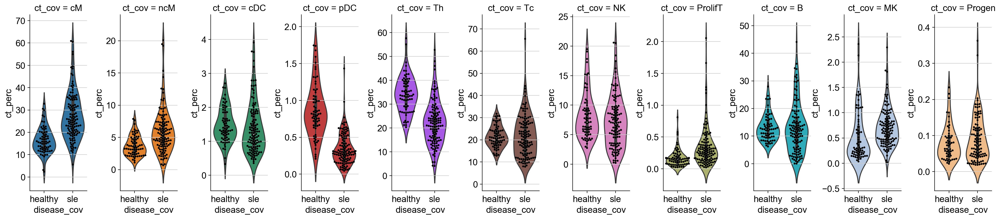

In [379]:
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])

perc_plot.savefig(figdir+"/violin.ct_cov.png")
#fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
#fig.tight_layout()

##for ct_i in list(range(10)) :
##    ct = ind_perc.ct_cov.cat.categories[ct_i]
##    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
##    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

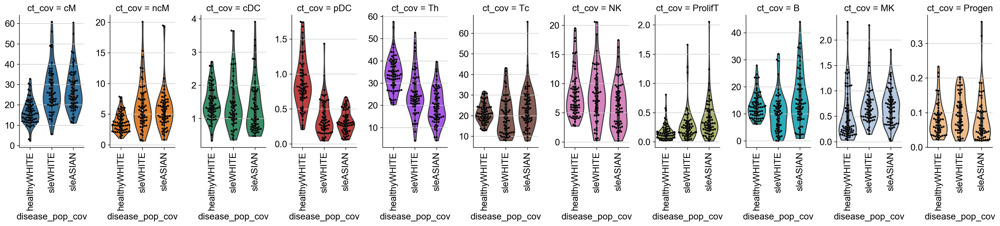

In [380]:
ind_perc['disease_pop_cov'] = pd.Categorical(ind_perc.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)
perc_plot = sns.catplot(x='disease_pop_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', aspect=0.5, height=4, 
                        dodge=False, sharex=False, sharey=False, cut=0)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_pop_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])
    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)


perc_plot.savefig(figdir+"/violin.ct_cov_pop.png")

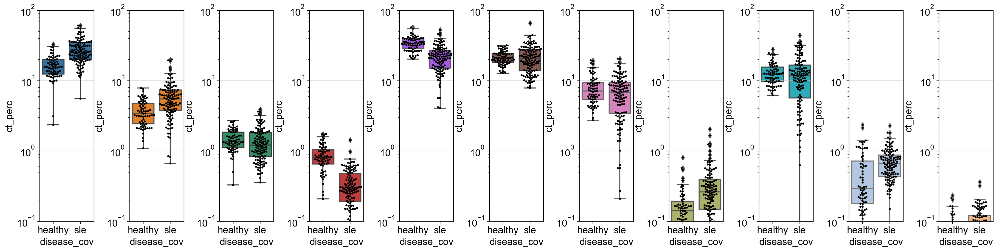

In [382]:
fig,ax = plt.subplots(nrows=1,ncols=11, figsize=(20,5))
fig.tight_layout()


for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ax[ct_i].set_yscale('log')
    ax[ct_i].set_ylim(0.1,100)
    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

In [73]:
##ax = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='box', col='ct_cov', height=8, aspect=1/4)
##ax.savefig("figures/boxplot.cat.png")

## Cell proportion analysis using all ImmVar samples

In [418]:
## Make proportion plots (Fig. 1D)

##adata_obs_small = adata.obs[(adata.obs.study_cov=="ImmVar") & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & (adata.obs.study_cov=="CLUES"))]
##adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
adata_obs_small = adata.obs;##[(adata.obs.batch_cov.str.contains("lupus"))]

##ind_count = adata_obs_small.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

##ind_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##ind_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count_sums = ind_count.groupby(["ind_cov","batch_cov"]).sum()
ind_count_sums = ind_count_sums.reset_index(name="counts")

##ind_perc = ind_count/ind_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ind_perc = ind_count/ind_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.counts > 100])]


In [419]:
print(ind_perc.shape)
print(ind_count_sums.shape)

## for now, let's filter out one of the reps for the healthies from UCSF only
ind_perc_broad = ind_perc[~ind_perc.batch_cov.str.contains("lupus")]
ind_perc_ucsf = ind_perc[ind_perc.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ct_cov','ind_cov'])
ind_perc = ind_perc_ucsf.append(ind_perc_broad);

ind_count_sums_broad = ind_count_sums[~ind_count_sums.batch_cov.str.contains("lupus")]
ind_count_sums_ucsf = ind_count_sums[ind_count_sums.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ind_cov'])
ind_count_sums = ind_count_sums_ucsf.append(ind_count_sums_broad);

print(ind_perc.shape)
print(ind_count_sums.shape)

##ind_count = ind_count.drop_duplicates(subset=['ct_cov','ind_cov'])

(2222, 6)
(206, 3)
(2036, 6)
(188, 3)


In [420]:
cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'Prolif T', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'dc','dc', 'mk', 'progen']})
ind_perc.ind_cov = ind_perc.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov = ind_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov = ind_perc.ind_cov.astype("str")
ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)
## do this to get monos and lympho to have similar colors as the major cell types
ind_perc.cg_cov = ind_perc.cg_cov.astype('category')
ind_perc.cg_cov = ind_perc.cg_cov.cat.reorder_categories(["mono", "dc", "mk", "progen","lymph"])

print('as a proportion of total PBMC ')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
    
print('\nwhite sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.pop_cov=="WHITE"].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[ind_perc.pop_cov=="WHITE"].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
print('\nwhite sle vs asian sle')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.disease_cov=="sle"].ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc[ind_perc.disease_cov=="sle"].pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), pop.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))

as a proportion of total PBMC 
Cell type:cM
Beta=-11.002108084148919, pvalue=2.0755744806922324e-13
Cell type:ncM
Beta=-2.309904050059174, pvalue=6.937683107940529e-07
Cell type:cDC
Beta=0.09298928061688937, pvalue=0.363162264720585
Cell type:pDC
Beta=0.5216408830602594, pvalue=1.9569646012584632e-26
Cell type:Th
Beta=11.978322751565553, pvalue=1.1234807138176555e-16
Cell type:Tc
Beta=-0.262925784594223, pvalue=0.8297522399565423
Cell type:NK
Beta=1.1232247922344825, pvalue=0.08295441058773852
Cell type:ProlifT
Beta=-0.17287537428268251, pvalue=2.809961235421723e-05
Cell type:B
Beta=0.23670878864158584, pvalue=0.8405162159899451
Cell type:MK
Beta=-0.18737044789554796, pvalue=0.0036436852597521783
Cell type:Progen
Beta=-0.01013194109896405, pvalue=0.30270689570151654

white sle vs white healthy
Cell type:cM
Beta=-11.041751036590842, pvalue=8.05337661797081e-11
Cell type:ncM
Beta=-2.6798122976523815, pvalue=4.1821568110389256e-07
Cell type:cDC
Beta=0.03423510372206011, pvalue=0.760984930

## Next, let's plot the proportions

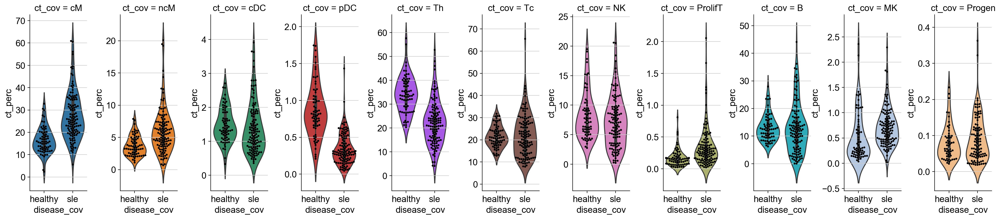

In [421]:
perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])

perc_plot.savefig(figdir+"/violin.ct_cov.png")
#fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
#fig.tight_layout()

##for ct_i in list(range(10)) :
##    ct = ind_perc.ct_cov.cat.categories[ct_i]
##    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
##    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

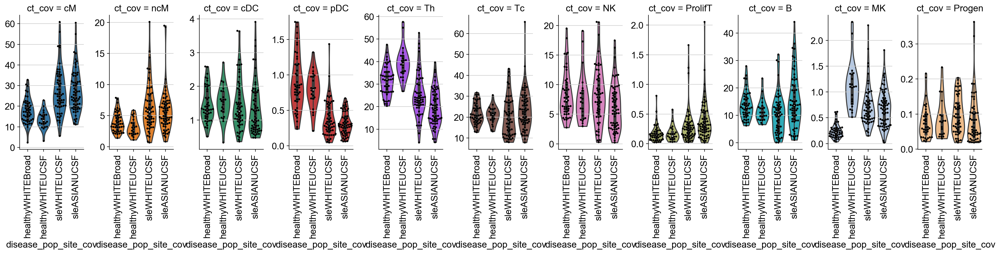

In [422]:
ind_perc['site'] = pd.Categorical(ind_perc.disease_cov, categories=['Broad','UCSF'])
ind_perc.site[ind_perc.batch_cov.str.contains("immvar")] = "Broad"
ind_perc.site[~ind_perc.batch_cov.str.contains("immvar")] = "UCSF"

ind_perc['disease_pop_site_cov'] = pd.Categorical(ind_perc.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)
perc_plot = sns.catplot(x='disease_pop_site_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', aspect=0.5, height=4, 
                        dodge=False, sharex=False, sharey=False, cut=0)
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_pop_site_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])
    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)


perc_plot.savefig(figdir+"/violin.ct_cov_pop_site.png")




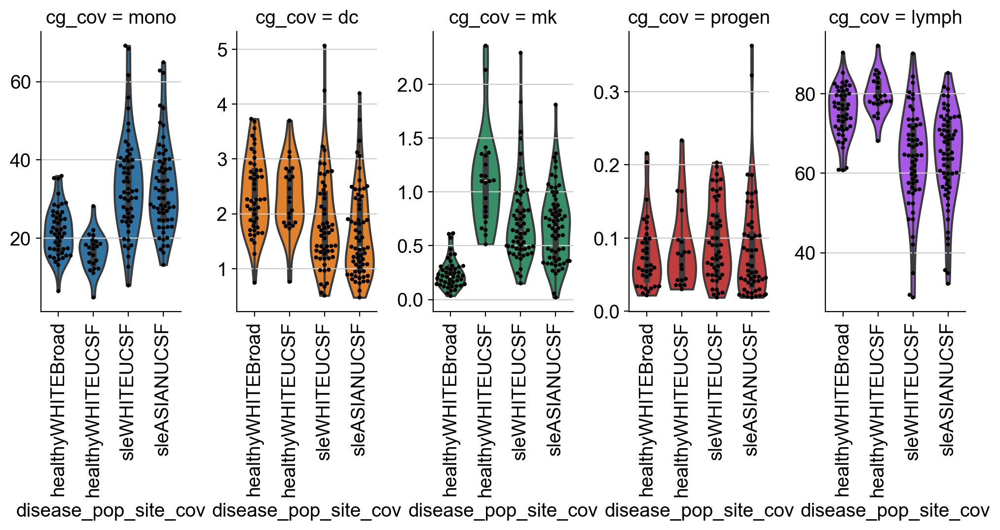

In [427]:
ind_group = ind_perc.groupby(['ind_cov','cg_cov','disease_cov','pop_cov','batch_cov','disease_pop_site_cov'])['ct_perc'].sum()
ind_group = ind_group.reset_index(name="cg_perc")
##ind_group.cg_cov = ind_group.cg_cov.astype('category')

group_plot = sns.catplot(x='disease_pop_site_cov', y='cg_perc', hue='cg_cov', data=ind_group, kind='violin', col='cg_cov', aspect=0.55, height=4, 
                        dodge=False, sharex=False, sharey=False, cut=0)
group_plot.set_xticklabels(rotation=90)
group_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for cg_i in list(range(len(ind_group.cg_cov.cat.categories))) :
    cg = ind_group.cg_cov.cat.categories[cg_i]
    sns.swarmplot(x="disease_pop_site_cov", y="cg_perc", data=ind_group[ind_group.cg_cov == cg], color="0", size=3, ax=group_plot.axes[0,cg_i])
    group_plot.axes[0,cg_i].get_yaxis().label.set_visible(False)

group_plot.savefig(figdir+"/violin.cg_cov_pop_site.png")

In [424]:
# fig,ax = plt.subplots(nrows=1,ncols=11, figsize=(20,5))
# fig.tight_layout()


# for ct_i in list(range(11)) :
#     ct = ind_perc.ct_cov.cat.categories[ct_i]
#     ax[ct_i].set_yscale('log')
#     ax[ct_i].set_ylim(0.1,100)
#     sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#     sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

In [73]:
##ax = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='box', col='ct_cov', height=8, aspect=1/4)
##ax.savefig("figures/boxplot.cat.png")

# Figure 1E: Correlation with EHR

## Some initial data wrangling

ok, there should be 127 lupus patients and 42 immvar donors, we only have estimated PBMC numbers for 11 of them so the final joined table will only have 

In [174]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_table("v2.clinical.data.txt", index_col=False)
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ind_perc.join(ind_count_sums.set_index(['ind_cov','batch_cov']), on=['ind_cov','batch_cov']);
joined = joined.join(clues_clinical.set_index('genotypeid'), on='ind_cov')
##joined = ind_perc.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_table("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_table("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))
## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined.pbmc = joined.pbmc.fillna(0)
joined = joined.assign(estimate=joined.ct_perc/100*joined.pbmc)

joined['disease_pop_cov'] = joined.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1)
joined[["ind_cov","disease_cov","ct_cov","disease_pop_cov"]] = joined[["ind_cov","disease_cov","ct_cov","disease_pop_cov"]].astype(str)
joined.plaquenilnow = joined.plaquenilnow.fillna(0)
joined.cellceptnow = joined.cellceptnow.fillna(0)
joined.steroralnow = joined.steroralnow.fillna(0)
joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)
joined.sledaiscore = joined.sledaiscore.fillna(0)


/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: read_table is deprecated, use read_csv instead, passing sep='\t'.
  
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: FutureWarning: read_table is deprecated, use read_csv instead.
  if __name__ == '__main__':
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:25: FutureWarning: read_table is deprecated, use read_csv instead.
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [175]:
indices = ['ind_cov',"disease_cov","disease_pop_cov","batch_cov", "pbmc","counts","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia","sledaiscore"];

joined_pivot = joined.pivot_table(index=indices, columns=["ct_cov"], values=["estimate"])
joined_pivot.reset_index(inplace=True)
joined_pivot.to_csv(name+"_joined_pivot_estimates.txt")

## this does not require the pbmc counts
joined_pivot_perc = joined.pivot_table(index=indices, columns="ct_cov", values="ct_perc")
joined_pivot_perc.reset_index(inplace=True)
joined_pivot_perc.to_csv(name+"_joined_pivot_ct_perc.txt")

joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

##filter joined
joined = joined[joined.pbmc > 0]
joined = joined[joined.pbmc < 10]

joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
joined_pivot = joined_pivot[joined_pivot.pbmc < 10]


##joined_agg = joined.groupby(['ind_cov','subjectid','disease_cov','ct_group','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc'])['ct_perc'].sum()

ehr_indices = ['subjectid','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','ct_group']
##joined_agg = joined.groupby(['ind_cov','subjectid','disease_cov','disease_pop_cov','ct_group','plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc'])['ct_perc'].sum()
joined_agg = joined.groupby(indices+ehr_indices)['ct_perc'].sum()

joined_agg = joined_agg.reset_index(name='ct_perc')

joined_agg[['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc']] = joined_agg[['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc']].astype(float)

joined_agg = joined_agg.assign(estimate=joined_agg.ct_perc/100*joined_agg.pbmc)
joined_agg[["subjectid","disease_cov",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid","disease_cov",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)
joined_agg_pivot = joined_agg.pivot_table(index=['ind_cov', "subjectid", "pbmc","disease_cov","disease_pop_cov",'plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore","WhiteBloodCell","AbsMono",'AbsBaso',"AbsLympho","AbsNeutro","AbsEosino","PlatCount"], columns="ct_group", values="estimate")
##joined_agg_pivot = joined_agg.pivot_table(index=indices+ehr_indices, columns="ct_group", values="estimate")
joined_agg_pivot.reset_index(inplace=True);

joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)


joined_agg_pivot_perc = joined_agg.pivot_table(index=['ind_cov', "subjectid", "pbmc","disease_cov",'disease_pop_cov','plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore","WhiteBloodCell","AbsMono",'AbsBaso',"AbsLympho","AbsNeutro","AbsEosino","PlatCount"], columns="ct_group", values="ct_perc")
##joined_agg_pivot_perc = joined_agg.pivot_table(index=indices+ehr_indices, columns="ct_group", values="ct_perc")
joined_agg_pivot_perc.reset_index(inplace=True);

##joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
joined_agg_pivot_perc[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)

## filter for some really bad samples
joined_agg_pivot_clues = joined_agg_pivot[joined_agg_pivot.AbsMono > 5/1000]
joined_agg_pivot_clues = joined_agg_pivot_clues[joined_agg_pivot.AbsLympho > 5/1000]
joined_agg_pivot_clues = joined_agg_pivot_clues[joined_agg_pivot.WhiteBloodCell > 0]

joined_agg_clues = joined_agg[joined_agg.AbsMono > 5/1000]
joined_agg_clues = joined_agg_clues[joined_agg.AbsLympho > 5/1000]
joined_agg_clues = joined_agg_clues[joined_agg.WhiteBloodCell > 0]

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:51: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:52: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:55: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:56: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


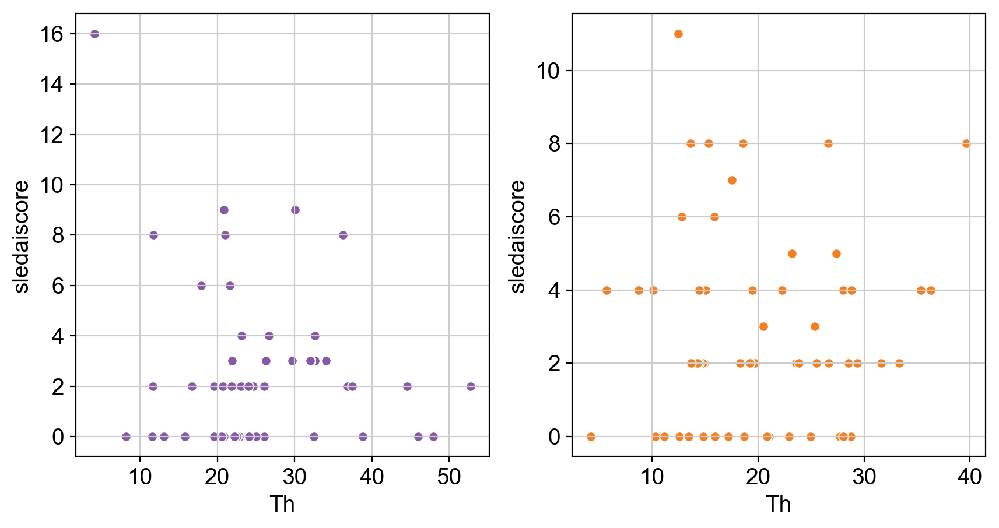

In [160]:
fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,5))
sns.scatterplot(x='Th', y='sledaiscore', data=joined_pivot_perc[joined_pivot_perc.disease_pop_cov=="sleWHITE"], color='#8559A5',ax=ax[0])
sns.scatterplot(x='Th', y='sledaiscore', data=joined_pivot_perc[joined_pivot_perc.disease_pop_cov=="sleASIAN"], color='#F47F20',ax=ax[1])

## Plot correlation for monocytes and lymphocytes

(0.9660444703282641, 1.554090627336992e-63)
(0.8815638515427816, 5.176917217561941e-36)


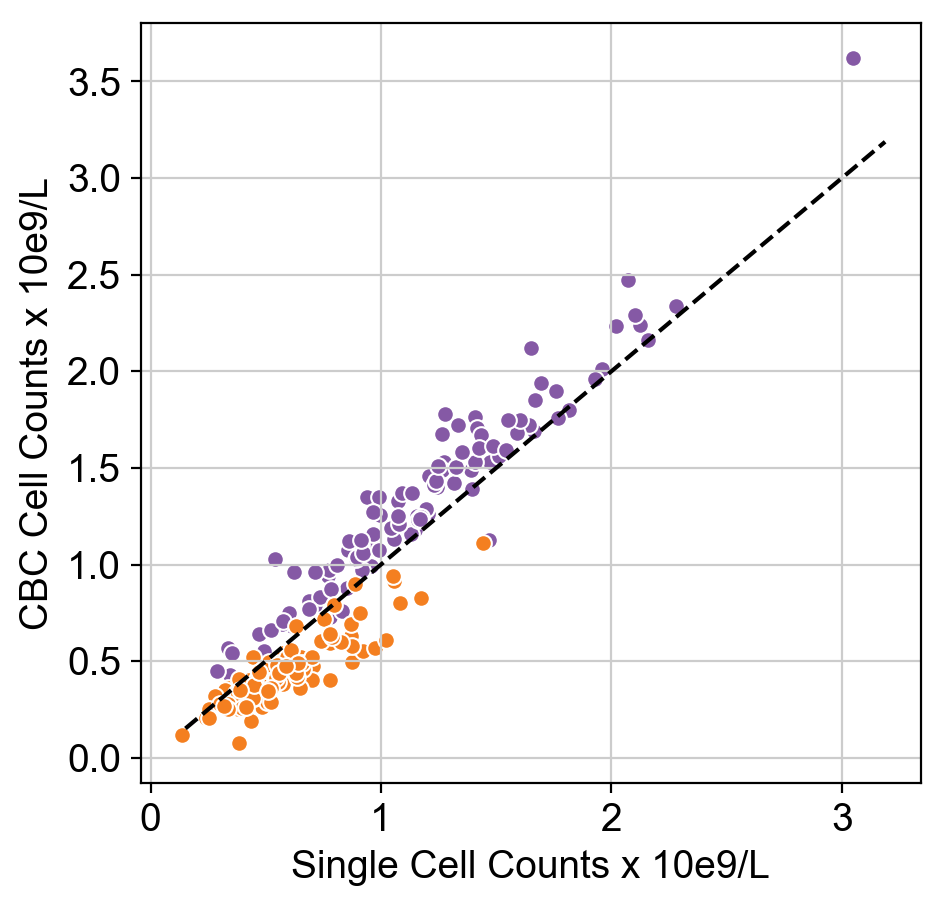

In [161]:
## calculate correlation
lympho_cor = stats.pearsonr(joined_agg_pivot_clues.lymph, joined_agg_pivot_clues.AbsLympho)
mono_cor = stats.pearsonr(joined_agg_pivot_clues.mono, joined_agg_pivot_clues.AbsMono)

fig,ax = plt.subplots(nrows=1,ncols=1, figsize=(5,5))
#fig.tight_layout()

sns.scatterplot(x='lymph', y='AbsLympho', data=joined_agg_pivot_clues, color='#8559A5',ax=ax)
ax.plot(ax.get_xlim(), ax.get_xlim(), '--', color='#000000')

sns.scatterplot(x='mono', y='AbsMono', data=joined_agg_pivot_clues, color='#F47F20',ax=ax)
ax.set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")

##ax[1].set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")
##ax[1].plot(ax[1].get_xlim(), ax[1].get_xlim(), '--', color='#000000')

fig.savefig(figdir+"ct.corr.png")

print(lympho_cor)
print(mono_cor)

## Plot cell abundance

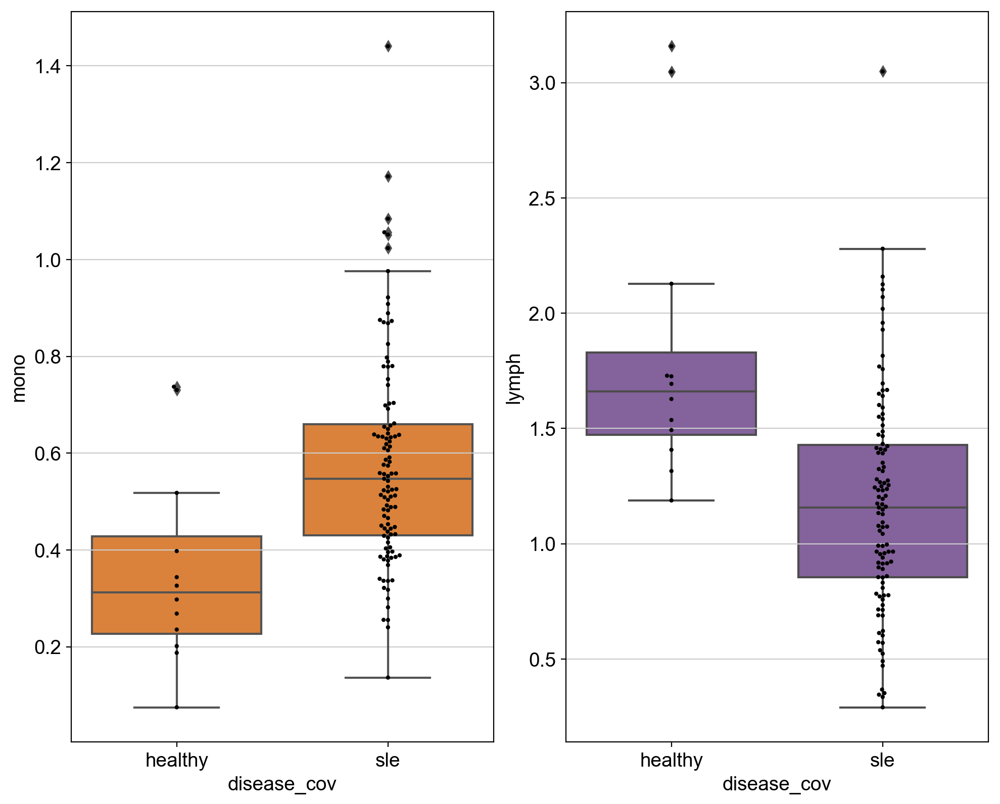

In [162]:
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
joined_agg_pivot.disease_cov = pd.Categorical(joined_agg_pivot.disease_cov,categories=['healthy','sle'], ordered=True)


fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,8))
fig.tight_layout()

for cg_i in [0, 1] :
    cg = ['mono', 'lymph'][cg_i]
    sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color=['#F47F20','#8559A5','#7f7f7f'][cg_i], ax=ax[cg_i])
    sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])

    

## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

# ##joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
# joined_agg_pivot_perc.disease_cov = pd.Categorical(joined_agg_pivot_perc.disease_cov,categories=['healthy','sle'], ordered=True)


# fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
# fig.tight_layout()

# for cg_i in [0, 1,2] :
#     cg = ['mono', 'lymph','lymph'][cg_i]
#     sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color=['#ff7f0e','#d62728','#7f7f7f'][cg_i], ax=ax[cg_i])
#     sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])


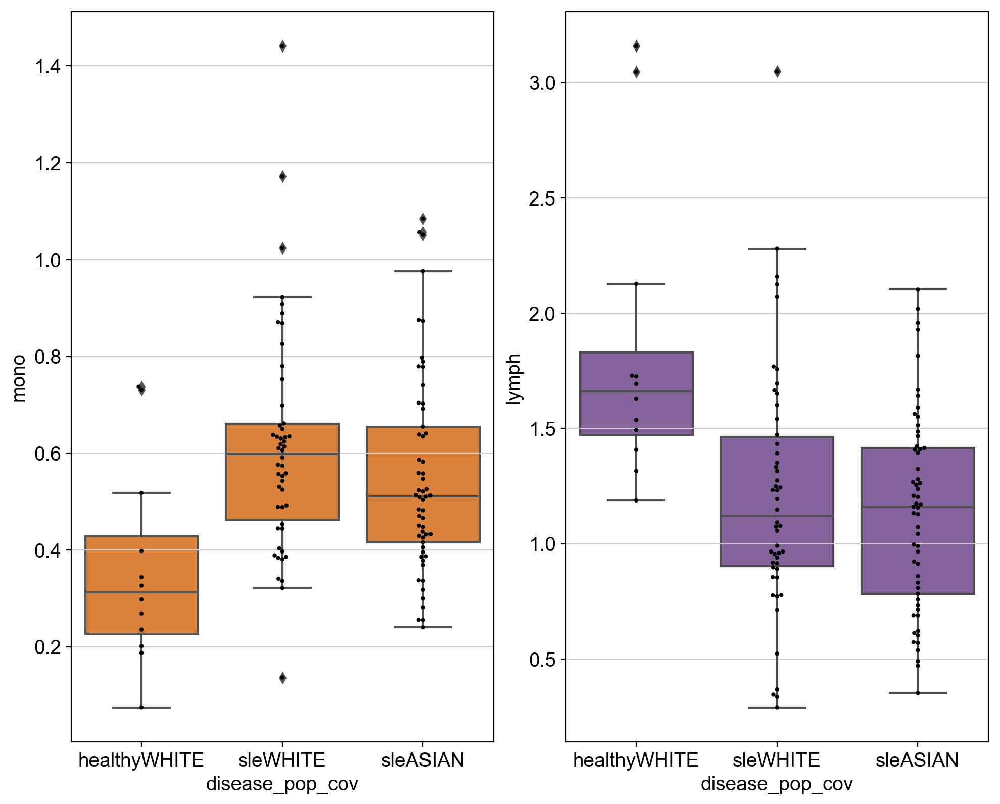

In [163]:
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

joined_agg.disease_pop_cov = pd.Categorical(joined_agg.disease_pop_cov,categories=['healthyWHITE','sleWHITE','sleASIAN'], ordered=True)
joined_agg_pivot.disease_pop_cov = pd.Categorical(joined_agg_pivot.disease_pop_cov,categories=['healthyWHITE','sleWHITE','sleASIAN'], ordered=True)


fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,8))
fig.tight_layout()

for cg_i in [0, 1] :
    cg = ['mono', 'lymph'][cg_i]
    sns.boxplot(x="disease_pop_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color=['#F47F20','#8559A5','#7f7f7f'][cg_i], ax=ax[cg_i])
    sns.swarmplot(x="disease_pop_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])

    
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

# ##joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
# joined_agg_pivot_perc.disease_cov = pd.Categorical(joined_agg_pivot_perc.disease_cov,categories=['healthy','sle'], ordered=True)


# fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
# fig.tight_layout()

# for cg_i in [0, 1,2] :
#     cg = ['mono', 'lymph','lymph'][cg_i]
#     sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color=['#ff7f0e','#d62728','#7f7f7f'][cg_i], ax=ax[cg_i])
#     sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])


In [164]:
# fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
# fig.tight_layout()

# for ct_i in list(range(10)) :
#     ct = ind_perc.ct_cov.cat.categories[ct_i]
#     sns.boxplot(x="disease_cov", y=ct, data=joined_pivot, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#     sns.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])
    
# perc_plot = sns.catplot(x='disease_cov', y='estimate', hue='ct_cov', data=joined, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)


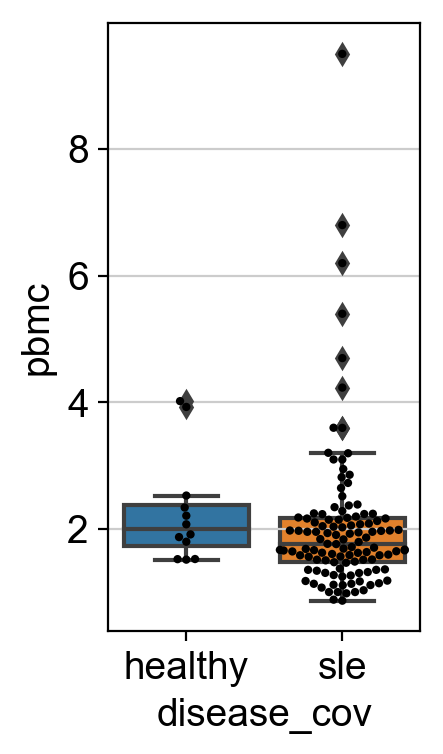

In [165]:
fig,ax = plt.subplots()
fig.set_size_inches(2,4)
ax = sns.boxplot(x="disease_cov", y="pbmc", data=joined_pivot)
ax = sns.swarmplot(x="disease_cov", y="pbmc", data=joined_pivot, color="0", size=3)


/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: read_table is deprecated, use read_csv instead.
  


Cell type:pDC,Race:White or Caucasian
Beta=0.026421768048560033, pvalue=0.25650563848207053
Cell type:pDC,Race:Black or African American
Beta=-0.0447331932773108, pvalue=0.21628339429165347
Cell type:pDC,Race:Asian
Beta=-0.015488095238095247, pvalue=0.4957218204336783
Cell type:pDC,Race:White or Caucasian
Beta=-0.4990948275862069, pvalue=8.000617380532096e-09
Cell type:pDC,Race:Black or African American
Beta=-0.7360336134453774, pvalue=0.0001811104138938749
Cell type:pDC,Race:Asian
Beta=-0.7384702380952379, pvalue=1.659635608701236e-14


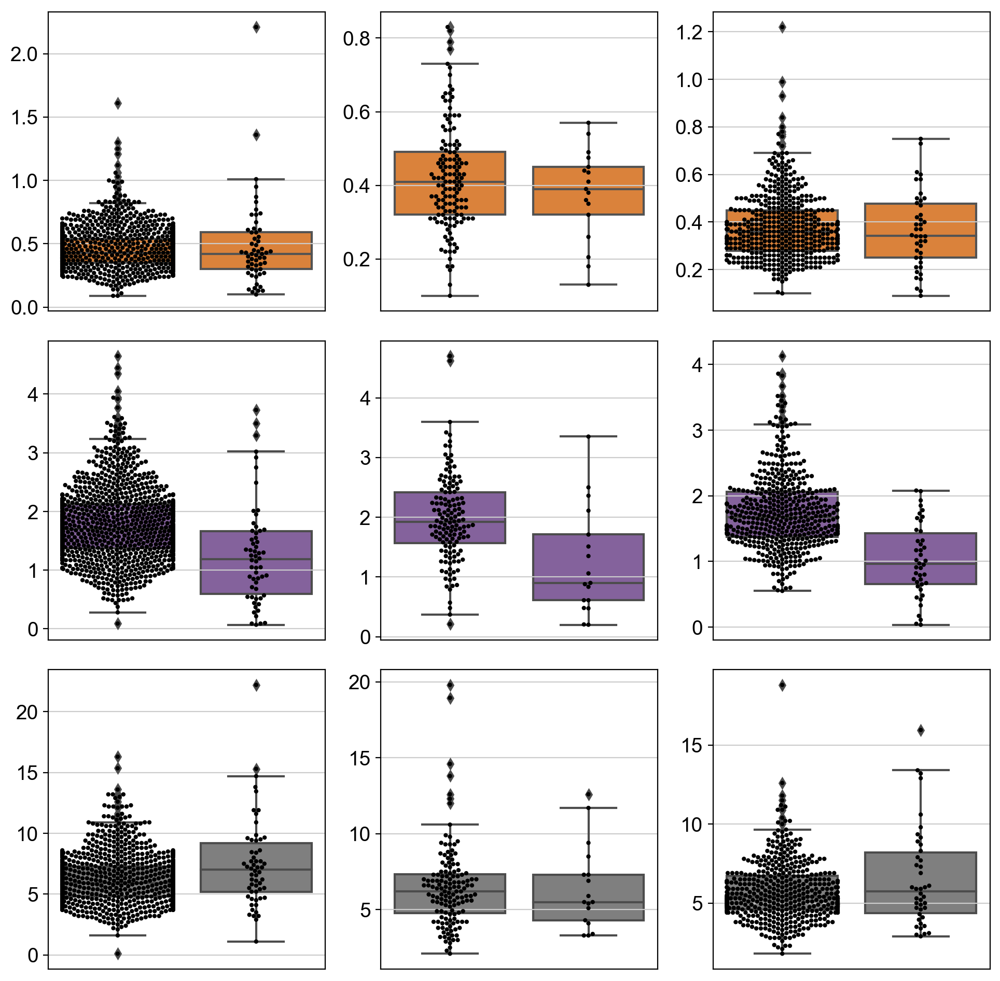

In [166]:
## Now let's analyze the EHR data
ehr = pd.read_table("meena_lupus_2017-11-15.csv", sep=",")
ehr_pivot = ehr.pivot_table(index=['Patient_ID',"Lab_Age","Patient_Sex","Patient_Race","CASE"],columns="Lab_Name",values="Lab_Value")
ehr_pivot.reset_index(inplace=True)
ehr_pivot = ehr_pivot[ehr_pivot['monocyte abs count'] < 5]
ehr_pivot = ehr_pivot[ehr_pivot['lymphocyte abs cnt'] < 6]

fig,ax = plt.subplots(nrows=3,ncols=3, figsize=(10,10))
fig.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0.1)

## find samples with both monocyte and lymphocyte count
for cg_i in [0, 1, 2] :
    cg = ['monocyte abs count', 'lymphocyte abs cnt', 'wbc count'][cg_i]
    for r_i in [0,1,2] :
        race = ['White or Caucasian', 'Black or African American', 'Asian'][r_i]
        sns.boxplot(x="CASE", y=cg, data=ehr_pivot[ehr_pivot.Patient_Race==race], color=['#F47F20','#8559A5','#7f7f7f'][cg_i], ax=ax[cg_i,r_i])
        sns.swarmplot(x="CASE", y=cg, data=ehr_pivot[ehr_pivot.Patient_Race==race], color="0", size=3, ax=ax[cg_i,r_i])
        ax[cg_i,r_i].get_xaxis().set_visible(False)
        ax[cg_i,r_i].get_yaxis().label.set_visible(False)


fig.savefig(figdir+"/ehr.boxplot.png")

##perc_plot = sns.catplot(x='CASE', y='Lab_Value', col='Lab_Name', data=ehr, kind='violin', row='Patient_Race', dodge=False, aspect=0.4, sharex=False, sharey=False)

## test for differences in abundance
for cg_i in [0, 1] :
    cg = ['monocyte abs count', 'lymphocyte abs cnt'][cg_i]
    for race in ['White or Caucasian', 'Black or African American', 'Asian'] :
        abundance = ehr_pivot[ehr_pivot.Patient_Race==race][cg].values
        disease = ehr_pivot.CASE[ehr_pivot.Patient_Race==race]
        disease = sm.add_constant(disease)
        print('Cell type:'+ ct +",Race:"+race)
        est=sm.OLS(abundance.astype(float), disease.astype(float))
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        print('Beta='+str(effect)+', pvalue='+str(pval))
        


/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to mat

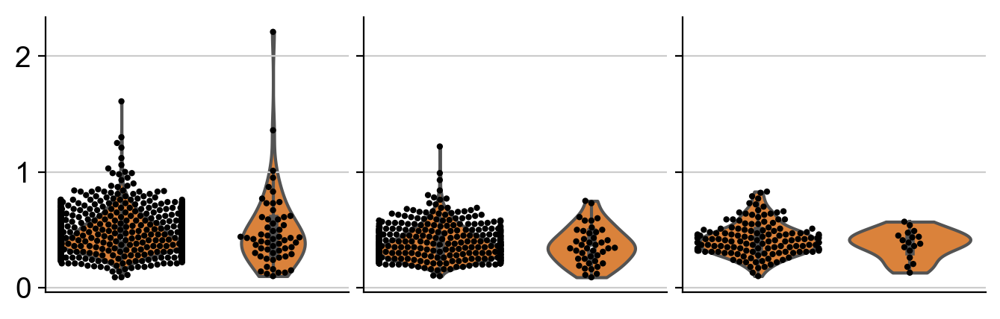

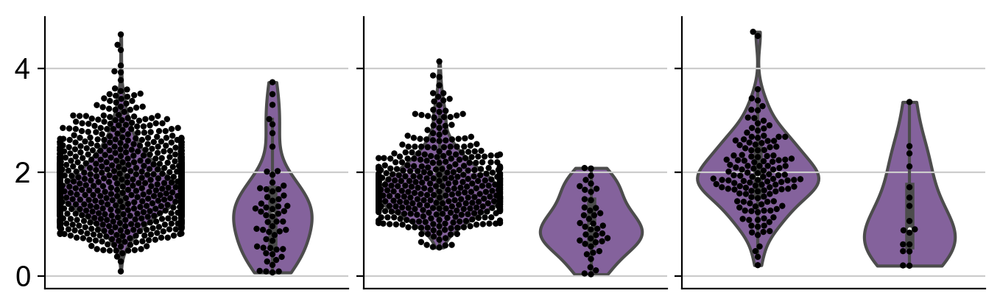

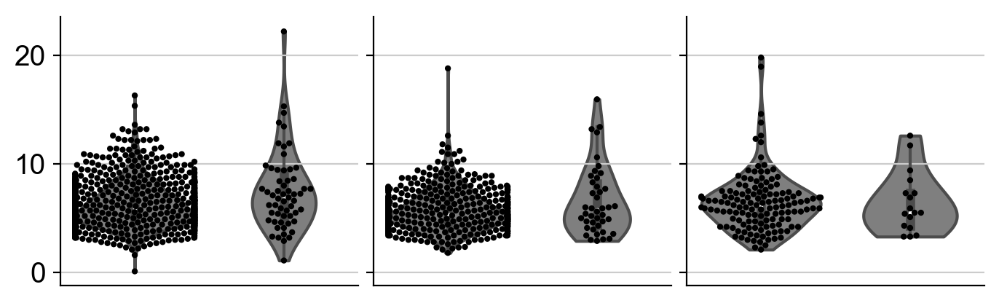

In [210]:
## Now let's analyze the EHR data
ehr_pivot_small = ehr_pivot[ehr_pivot.Patient_Race.isin(['White or Caucasian', 'Black or African American', 'Asian'])]

ehr_pivot_small_melt = ehr_pivot_small.melt(id_vars=['Patient_Race','CASE'], value_vars=["lymphocyte abs cnt", "monocyte abs count", "wbc count"])

for cg_i in [0, 1, 2] :
    cg = ['monocyte abs count', 'lymphocyte abs cnt', 'wbc count'][cg_i]
    ehr_plot = sns.catplot(x='CASE', y=cg, col='Patient_Race', data=ehr_pivot_small, kind='violin', color=['#F47F20','#8559A5','#7f7f7f'][cg_i], height = 3, aspect=0.9, dodge=False, sharex=False, sharey=True, cut=0)
    ehr_plot.fig.subplots_adjust(wspace=0.05)
    
    for r_i in [0,1,2] :
        race = ['White or Caucasian', 'Asian', 'Black or African American'][r_i]
        sns.swarmplot(x="CASE", y=cg, data=ehr_pivot_small[ehr_pivot.Patient_Race==race], color="0", size=3, ax=ehr_plot.axes[0,r_i])
        ehr_plot.axes[0,r_i].get_yaxis().label.set_visible(False)
        ehr_plot.axes[0,r_i].get_xaxis().label.set_visible(False)
        ehr_plot.axes[0,r_i].get_xaxis().set_visible(False)
        ##ehr_plot.axes[0,r_i].get_xaxis().ticklabels.set_visible(False)
        ##ehr_plot.axes[0,r_i].setxaxislabelsticklabels.set_visible(False)
        ehr_plot.set_titles(row_template = '', col_template = '')

    ##ax[cg_i,r_i].get_xaxis().set_visible(False)
    ##ax[cg_i,r_i].get_yaxis().label.set_visible(False)
    ##    ehr_plot.set_xticklabels(rotation=90)
    ehr_plot.savefig(figdir+cg+".violin.ehr.png")

##fig.savefig(figdir+"/ehr.violin.png")

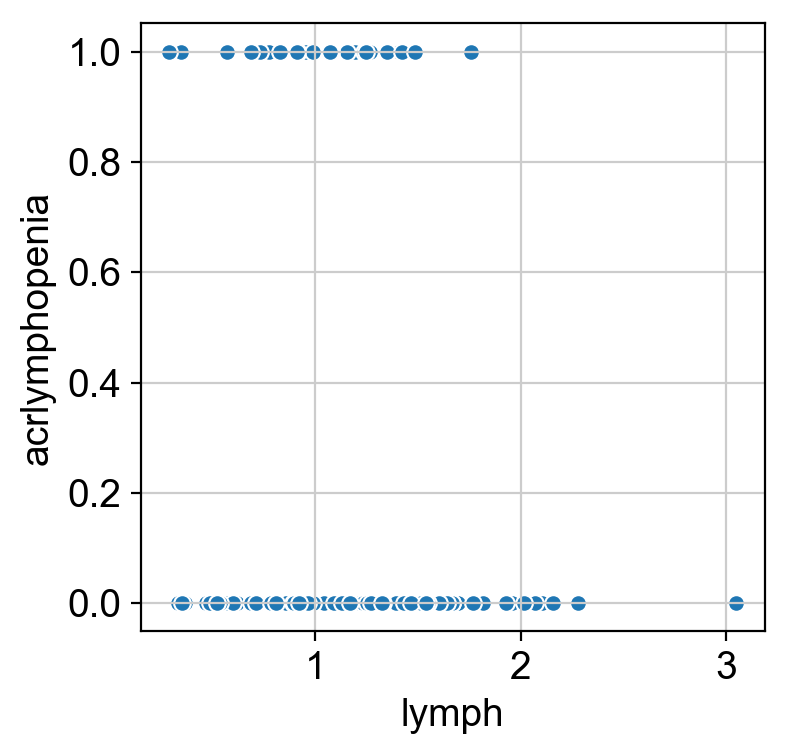

In [168]:
sns.scatterplot(joined_agg_pivot_clues.lymph, joined_agg_pivot_clues.acrlymphopenia)

# Supplementary figures

## Take a look at the effects of treatment

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


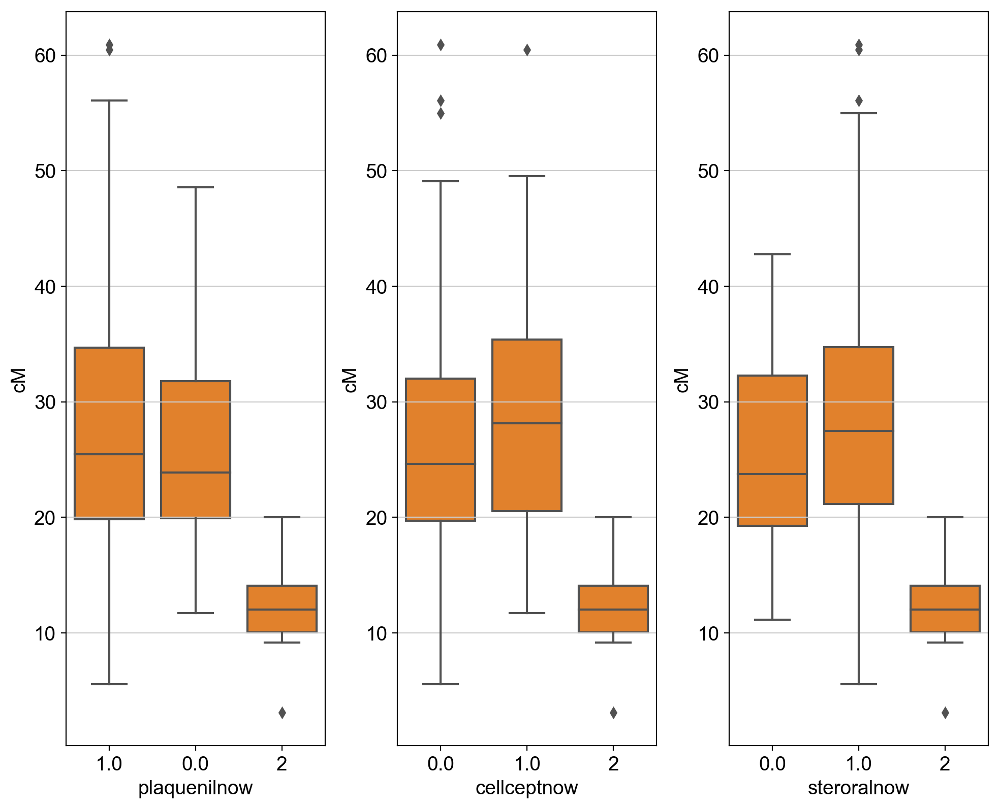

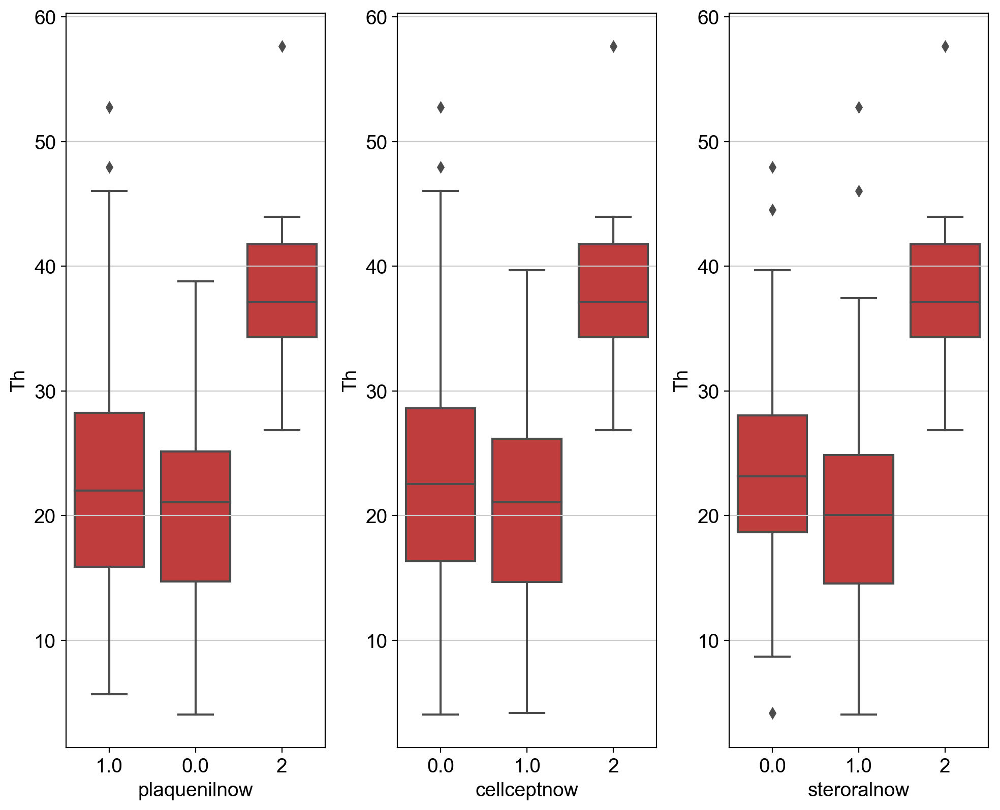

In [169]:
fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
fig.tight_layout()

joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    sns.boxplot(x=drug, y="cM", data=joined_pivot_perc, color='#ff7f0e', ax=ax[drug_i])

fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
fig.tight_layout()

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    sns.boxplot(x=drug, y="Th", data=joined_pivot_perc, color='#d62728', ax=ax[drug_i])


/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:

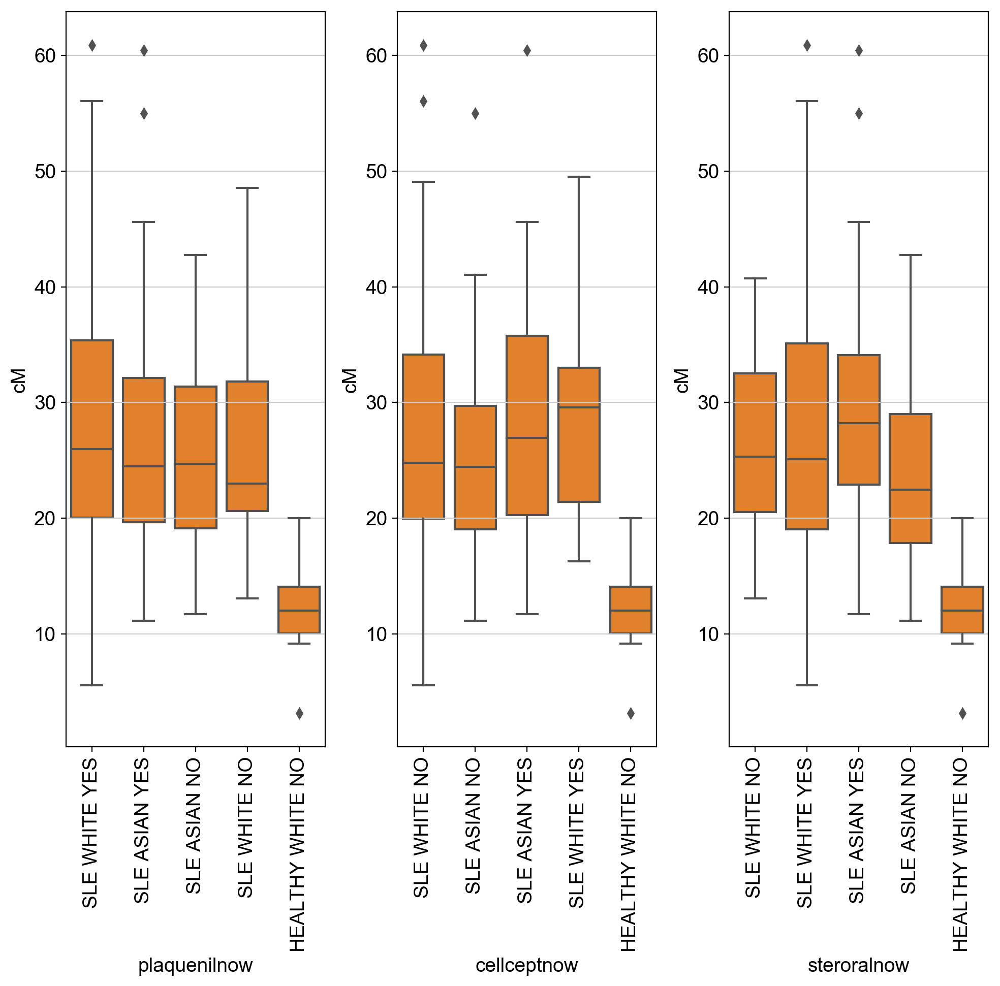

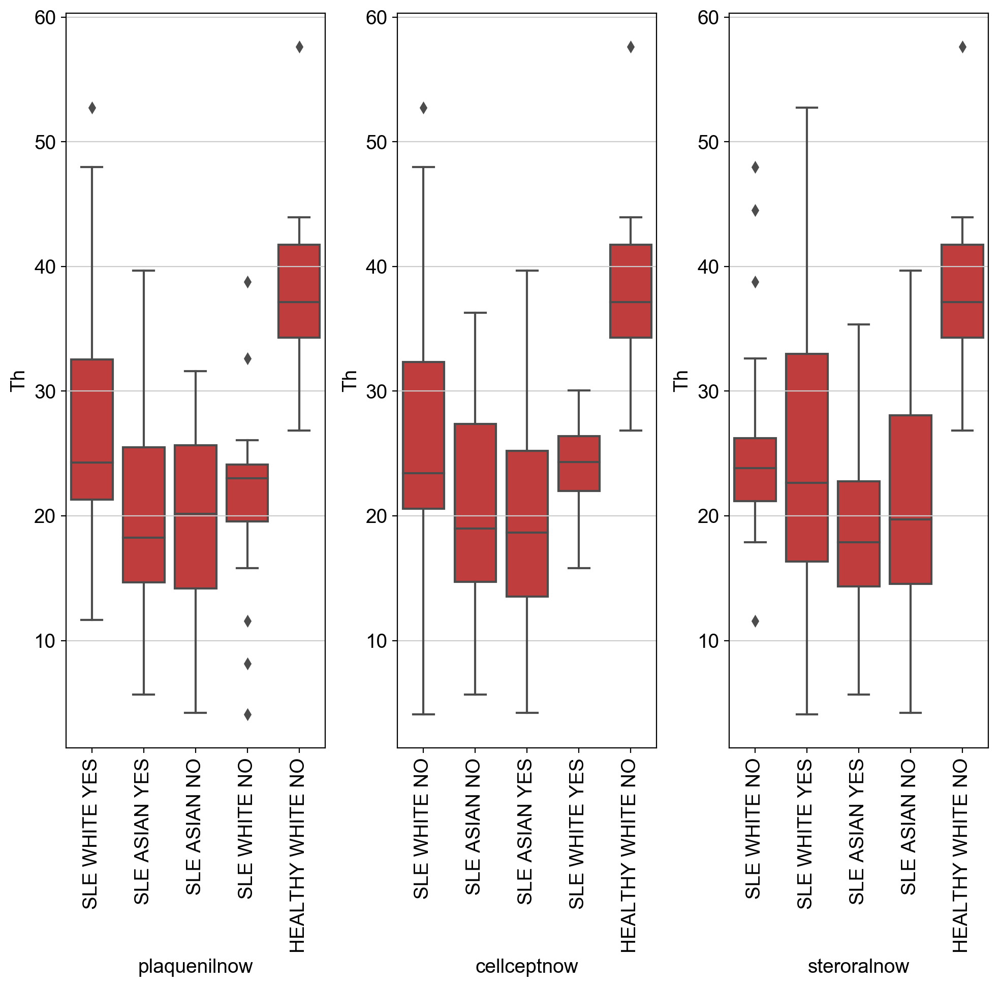

In [170]:
fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
fig.tight_layout()

joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="healthyWHITE")] = "HEALTHY WHITE NO";
joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.plaquenilnow==1)] = "SLE WHITE YES";
joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.plaquenilnow==0)] = "SLE WHITE NO";
joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.plaquenilnow==1)] = "SLE ASIAN YES";
joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.plaquenilnow==0)] = "SLE ASIAN NO";

joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="healthyWHITE")] = "HEALTHY WHITE NO";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.cellceptnow==1)] = "SLE WHITE YES";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.cellceptnow==0)] = "SLE WHITE NO";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.cellceptnow==1)] = "SLE ASIAN YES";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.cellceptnow==0)] = "SLE ASIAN NO";

joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="healthyWHITE")] = "HEALTHY WHITE NO";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.steroralnow==1)] = "SLE WHITE YES";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.steroralnow==0)] = "SLE WHITE NO";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.steroralnow==1)] = "SLE ASIAN YES";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.steroralnow==0)] = "SLE ASIAN NO";

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    p = sns.boxplot(x=drug, y="cM", data=joined_pivot_perc, color='#ff7f0e', ax=ax[drug_i])
    p.set_xticklabels(ax[drug_i].get_xticklabels(), rotation=90)
    
fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
fig.tight_layout()

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    p = sns.boxplot(x=drug, y="Th", data=joined_pivot_perc, color='#d62728', ax=ax[drug_i])
    p.set_xticklabels(ax[drug_i].get_xticklabels(), rotation=90)
